In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['figure.dpi'] = 500
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


In [3]:
df = pd.read_csv('heart_disease.csv')

In [4]:
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,FALSE,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,FALSE,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,FALSE,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,FALSE,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,TRUE,1.5,flat,fixed defect,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,Male,asymptomatic,125,0,False,normal,120,FALSE,1.5,upsloping,reversable defect,4
904,62,Male,asymptomatic,166,170,False,st-t abnormality,120,TRUE,3.0,flat,reversable defect,4
905,56,Male,non-anginal,170,0,False,lv hypertrophy,123,TRUE,2.5,downsloping,normal,4
906,56,Male,non-anginal,144,208,True,st-t abnormality,105,TURE,NaN,downsloping,normal,4


# Data Preparation

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 908 entries, 0 to 907
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       908 non-null    int64  
 1   sex       908 non-null    object 
 2   cp        908 non-null    object 
 3   trestbps  908 non-null    int64  
 4   chol      908 non-null    int64  
 5   fbs       908 non-null    bool   
 6   restecg   908 non-null    object 
 7   thalch    908 non-null    int64  
 8   exang     908 non-null    object 
 9   oldpeak   846 non-null    float64
 10  slope     908 non-null    object 
 11  thal      908 non-null    object 
 12  num       908 non-null    int64  
dtypes: bool(1), float64(1), int64(5), object(6)
memory usage: 86.1+ KB


In [7]:
df.isna().sum()

age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalch       0
exang        0
oldpeak     62
slope        0
thal         0
num          0
dtype: int64

In [8]:
df.oldpeak.median()

0.5

In [9]:
df['oldpeak'].fillna(df['oldpeak'].median(), inplace=True)

In [10]:
df.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalch      0
exang       0
oldpeak     0
slope       0
thal        0
num         0
dtype: int64

In [13]:
df.describe()

,age,trestbps,chol,thalch,oldpeak,num
count,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000
mean,53.791850,133.430617,201.484581,135.957048,0.864537,1.008811
std,9.158031,20.401608,112.097949,26.804929,1.060433,1.144436
min,29.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.750000,120.000000,176.750000,118.000000,0.000000,0.000000
50%,54.000000,130.000000,224.000000,138.000000,0.500000,1.000000
75%,60.000000,144.000000,270.000000,156.000000,1.500000,2.000000
max,77.000000,200.000000,603.000000,202.000000,6.200000,4.000000


In [14]:
print(df['exang'].unique())

['FALSE' 'TRUE' 'TURE']


In [16]:
df['exang'] = df['exang'].replace("TURE", "TRUE")

In [17]:
print(df['exang'].unique())

['FALSE' 'TRUE']


# Exploratory Data Analysis (EDA)

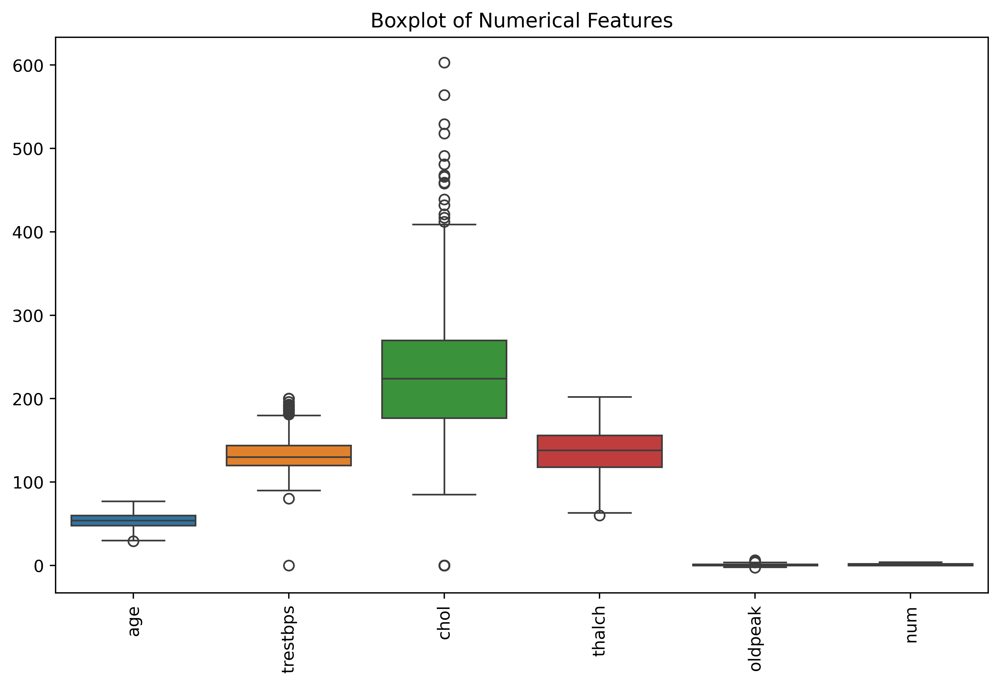

In [11]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df.select_dtypes(include=['number']))
plt.xticks(rotation=90)
plt.title("Boxplot of Numerical Features")
plt.show()

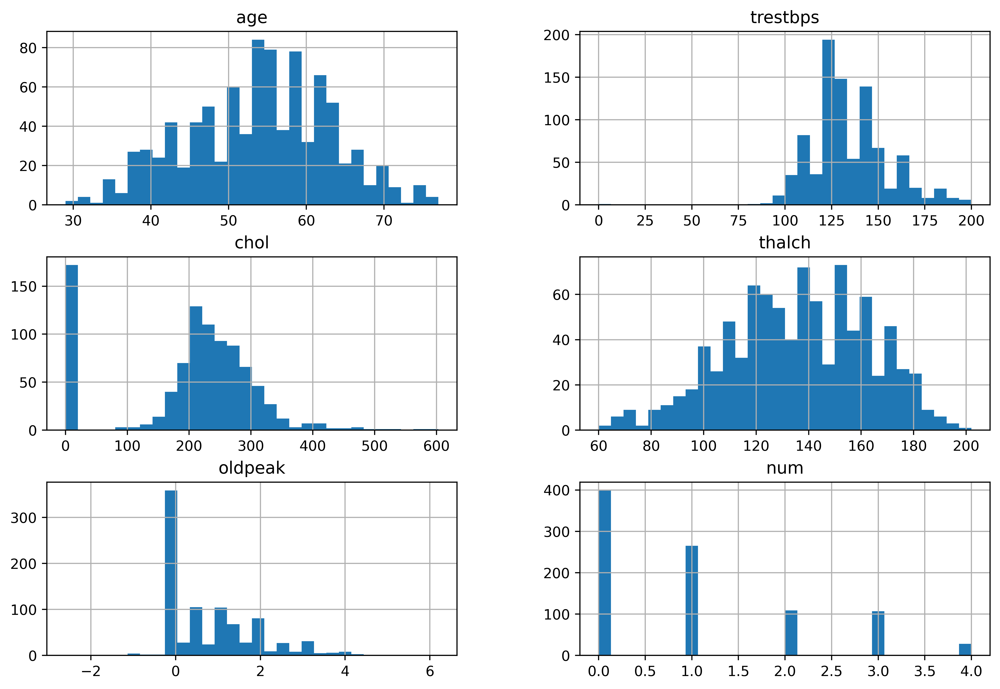

In [12]:
df.hist(figsize=(12, 8), bins=30)
plt.show()

In [27]:
categorical_cols = ['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'thal']  # List of categorical columns
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

In [29]:
corr_matrix = df.corr()

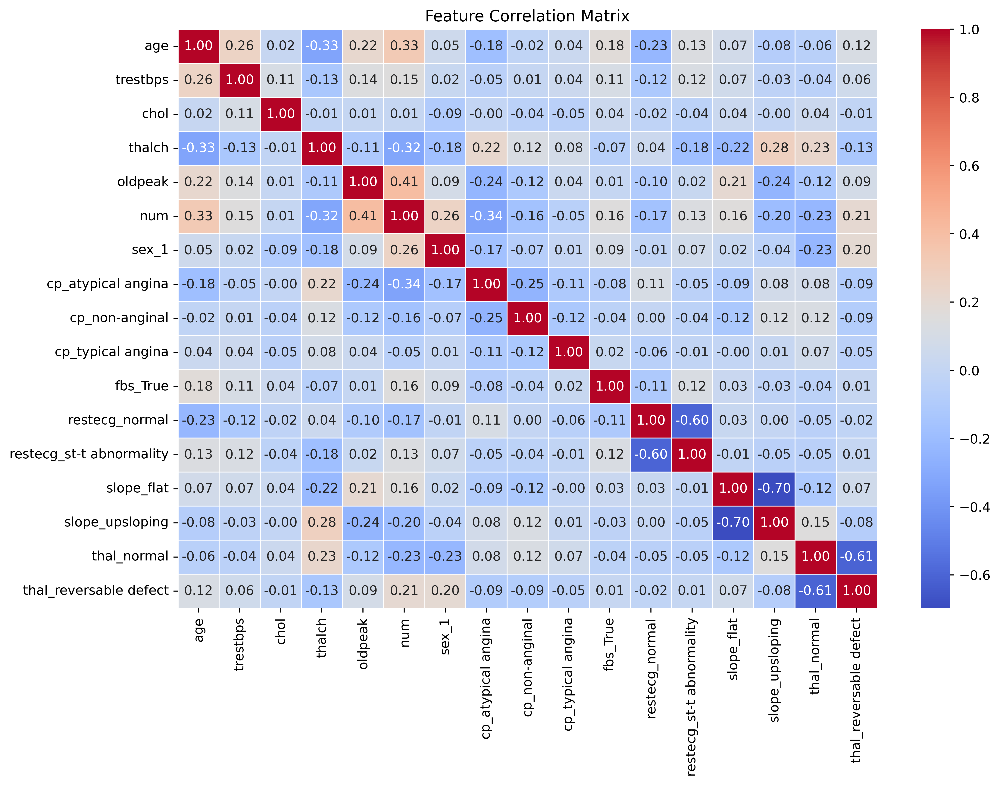

In [30]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Matrix")
plt.show()

In [31]:
sns.pairplot(df)

In [32]:
X = df.drop(columns=['num'])  # Features (drop target column)
y = df['num']      

In [34]:
X

,age,trestbps,chol,thalch,oldpeak,sex_1,cp_atypical angina,cp_non-anginal,cp_typical angina,fbs_True,restecg_normal,restecg_st-t abnormality,slope_flat,slope_upsloping,thal_normal,thal_reversable defect
0,63,145.0,233.0,150,2.3,True,False,False,True,True,False,False,False,False,False,False
1,41,135.0,203.0,132,0.0,True,True,False,False,False,True,False,True,False,False,False
2,57,140.0,192.0,148,0.4,True,False,False,False,False,True,False,True,False,False,False
3,52,118.0,186.0,190,0.0,True,False,False,True,False,False,False,True,False,False,False
4,57,110.0,201.0,126,1.5,True,False,False,False,False,True,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,125.0,240.0,120,1.5,True,False,False,False,False,True,False,False,True,False,True
904,62,166.0,170.0,120,3.0,True,False,False,False,False,False,True,True,False,False,True
905,56,170.0,240.0,123,2.5,True,False,True,False,False,False,False,False,False,True,False
906,56,144.0,208.0,105,0.5,True,False,True,False,True,False,True,False,False,True,False


# Feature Engineering

In [37]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X) 

In [38]:
X_scaled

array([[ 1.00602683,  0.57407853, -0.25146216, ..., -0.69894534,
        -0.75740138, -0.80493036],
       [-1.39756029,  0.07165607, -0.79235204, ..., -0.69894534,
        -0.75740138, -0.80493036],
       [ 0.35050307,  0.3228673 , -0.99067832, ..., -0.69894534,
        -0.75740138, -0.80493036],
       ...,
       [ 0.24124911,  1.83013469, -0.12525453, ..., -0.69894534,
         1.32030391, -0.80493036],
       [ 0.24124911,  0.52383629, -0.70220373, ..., -0.69894534,
         1.32030391, -0.80493036],
       [ 0.35050307,  0.42335179,  0.54184298, ..., -0.69894534,
        -0.75740138,  1.2423435 ]])

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

In [45]:
dt = DecisionTreeClassifier(criterion='entropy')

dt.fit(X_train,y_train)
y_pred = dt.predict(X_test)
y_pred

array([1, 2, 1, 0, 1, 1, 1, 3, 2, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 3, 0,
       2, 0, 0, 0, 2, 0, 2, 0, 0, 1, 1, 2, 0, 1, 2, 0, 3, 2, 0, 0, 0, 2,
       0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 3, 1, 0, 1, 0, 0, 0, 3,
       0, 0, 0, 3, 2, 1, 1, 0, 3, 0, 1, 0, 4, 0, 1, 2, 1, 1, 1, 1, 0, 1,
       0, 0, 0, 3, 1, 2, 1, 0, 1, 3, 0, 4, 0, 1, 3, 3, 0, 0, 0, 3, 1, 3,
       0, 0, 2, 1, 1, 4, 0, 3, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 3, 1, 1, 1, 3, 1, 0, 1, 0, 3, 1, 2, 2, 4, 3,
       2, 1, 3, 1, 0, 0, 1, 0, 2, 0, 0, 3, 2, 2, 1, 1, 1, 1, 0, 1, 0, 1,
       2, 0, 0, 0, 0, 1], dtype=int64)

In [49]:
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.70      0.70        80
           1       0.48      0.51      0.50        53
           2       0.14      0.14      0.14        22
           3       0.19      0.19      0.19        21
           4       0.00      0.00      0.00         6

    accuracy                           0.49       182
   macro avg       0.30      0.31      0.31       182
weighted avg       0.49      0.49      0.49       182



In [46]:
confusion_matrix(y_test,y_pred)

array([[56, 11,  4,  7,  2],
       [14, 27,  6,  6,  0],
       [ 5, 10,  3,  3,  1],
       [ 4,  7,  5,  4,  1],
       [ 1,  1,  3,  1,  0]], dtype=int64)

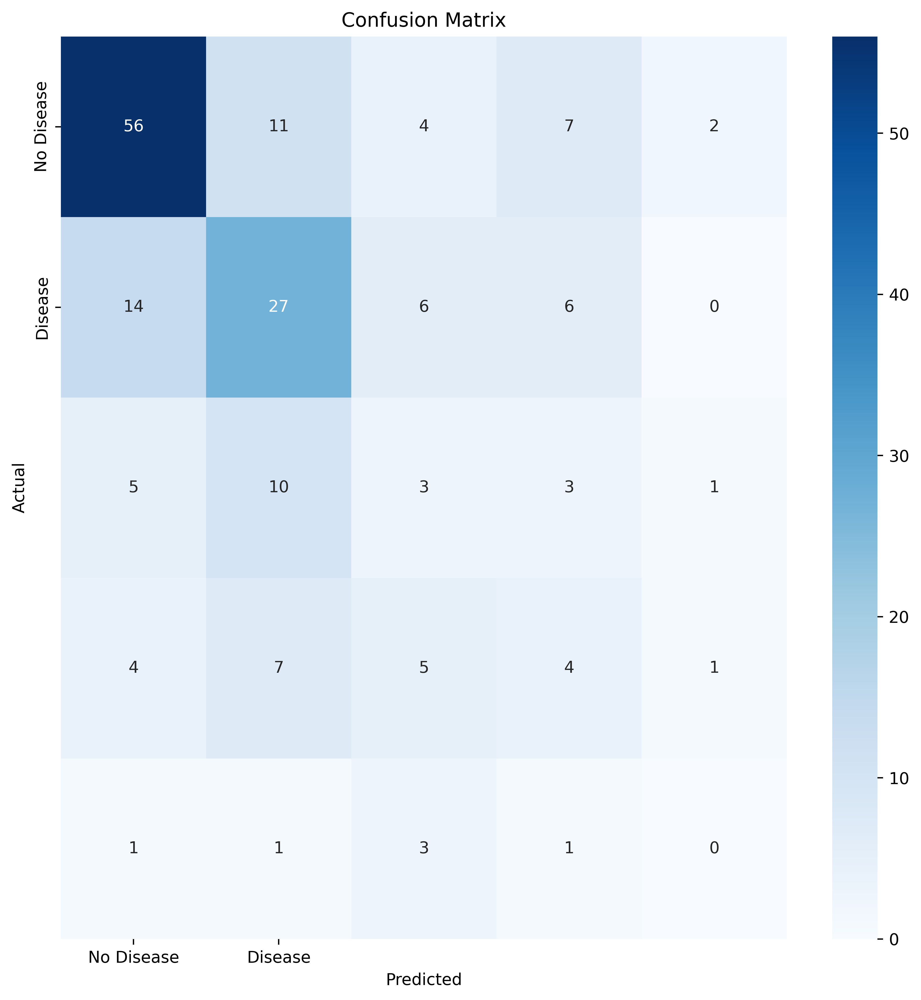

In [50]:
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["No Disease", "Disease"], yticklabels=["No Disease", "Disease"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [57]:
roc_auc = roc_auc_score(y_test, dt.predict_proba(X_test), multi_class="ovr")
print(f"ROC-AUC Score: {roc_auc:.2f}")

ROC-AUC Score: 0.58


In [58]:
print('Training accuracy: ', dt.score(X_train,y_train))
print('Testing Accuracy: ', dt.score(X_test,y_test))

Training accuracy:  1.0
Testing Accuracy:  0.4945054945054945


# Decision Tree Classification

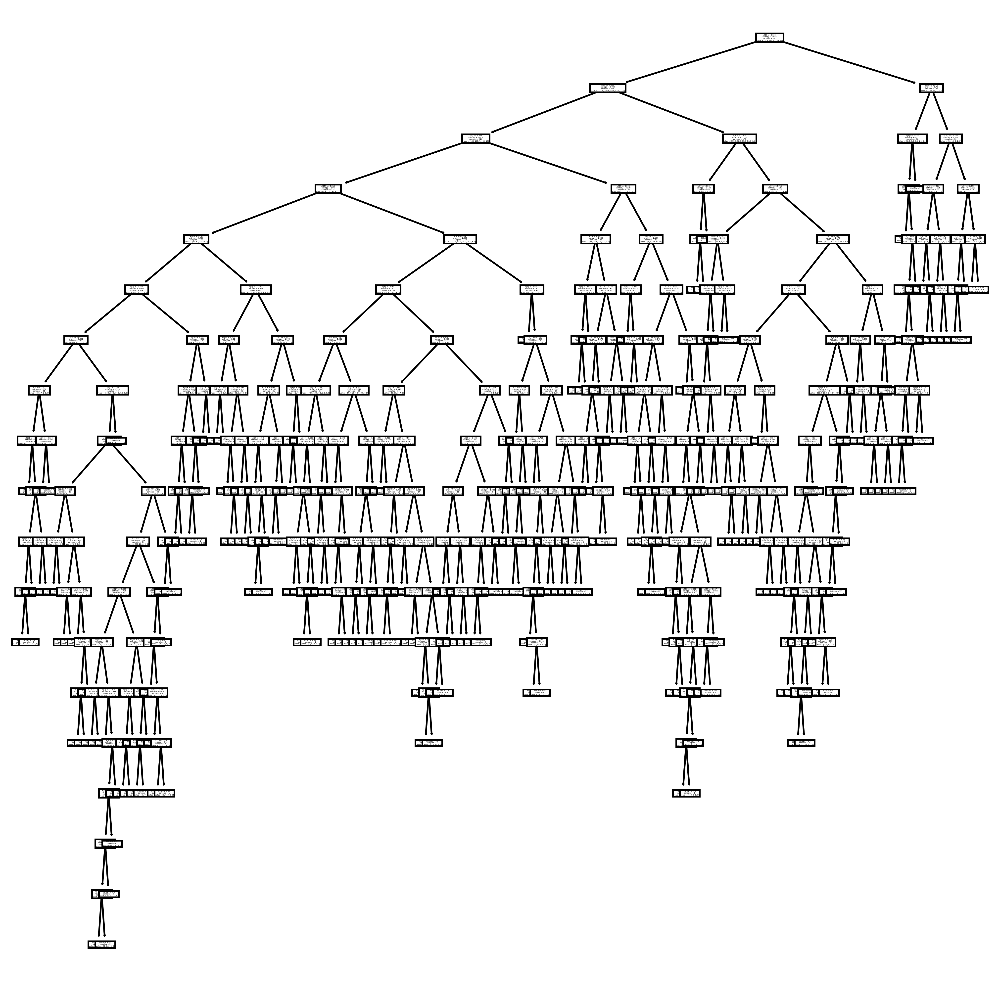

In [63]:
tree.plot_tree(dt)
plt.show()

In [66]:
num_value = np.int64(42)  # Example numerical value
print("The number is: " + str(num_value))

The number is: 42


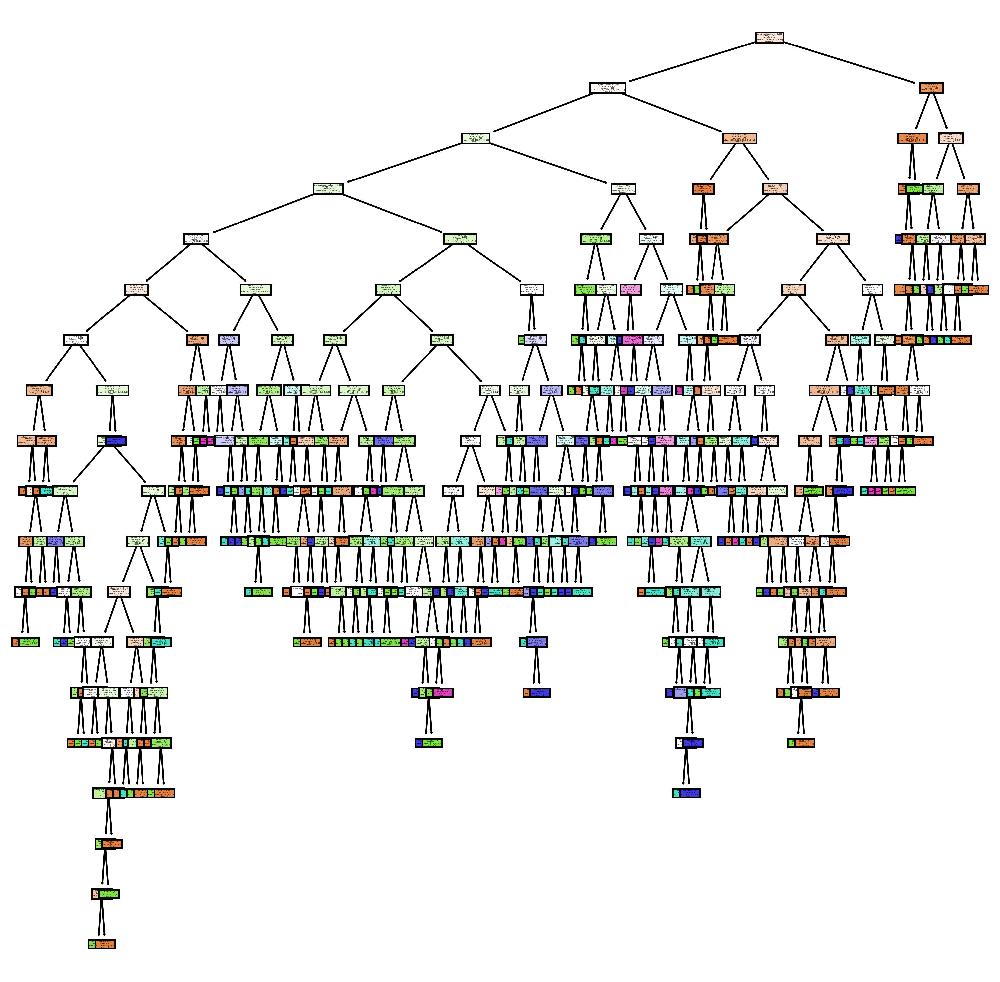

In [68]:
tree.plot_tree(dt, feature_names=X.columns, 
               class_names=["0","1","2","3","4"],
              filled=True)
plt.show()

# Hyperparameter Tuning

In [72]:
dtc = DecisionTreeClassifier(criterion='gini')

In [74]:
dtc.fit(X_train,y_train)
ypred = dtc.predict(X_test)

In [76]:
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.70      0.61      0.65        80
           1       0.36      0.40      0.38        53
           2       0.05      0.05      0.05        22
           3       0.18      0.24      0.20        21
           4       0.00      0.00      0.00         6

    accuracy                           0.42       182
   macro avg       0.26      0.26      0.26       182
weighted avg       0.44      0.42      0.43       182



In [77]:
dtc.score(X_train,y_train), dtc.score(X_test,y_test)

(1.0, 0.4175824175824176)

In [78]:
df.head()

,age,trestbps,chol,thalch,oldpeak,num,sex_1,cp_atypical angina,cp_non-anginal,cp_typical angina,fbs_True,restecg_normal,restecg_st-t abnormality,slope_flat,slope_upsloping,thal_normal,thal_reversable defect
0,63,145.0,233.0,150,2.3,0,True,False,False,True,True,False,False,False,False,False,False
1,41,135.0,203.0,132,0.0,0,True,True,False,False,False,True,False,True,False,False,False
2,57,140.0,192.0,148,0.4,0,True,False,False,False,False,True,False,True,False,False,False
3,52,118.0,186.0,190,0.0,0,True,False,False,True,False,False,False,True,False,False,False
4,57,110.0,201.0,126,1.5,0,True,False,False,False,False,True,False,True,False,False,False


In [79]:
x = df.iloc[:,:3]
y = df['thalch']

In [80]:
x

,age,trestbps,chol
0,63,145.0,233.0
1,41,135.0,203.0
2,57,140.0,192.0
3,52,118.0,186.0
4,57,110.0,201.0
...,...,...,...
903,53,125.0,240.0
904,62,166.0,170.0
905,56,170.0,240.0
906,56,144.0,208.0


In [81]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.3, random_state=42)

In [82]:
from sklearn.tree import DecisionTreeRegressor

In [83]:
dtr = DecisionTreeRegressor()

dtr.fit(xtrain,ytrain)
yp = dtr.predict(xtest)
yp

array([ 84. , 124. , 144. ,  97. ,  90. ,  71. ,  94. , 139. , 106. ,
       135. , 122. , 149. , 150. , 136. , 163. , 118. , 150. , 175. ,
       120. , 100. ,  90. , 170. , 166.5, 142. , 155. , 115. , 110. ,
        90. , 137. , 138. , 170. ,  87. , 140. , 159. , 122. , 168. ,
       175. , 149. , 160. , 108. , 145. , 173. , 157. , 125. , 165. ,
        86. , 158. , 138. , 188. , 144. , 158. , 120. , 144. , 164. ,
       114. , 135. , 101. , 140. , 129. , 140. , 139. ,  80. , 132. ,
       153. , 175. ,  82. , 155. , 100. , 114. , 180. , 162. , 154. ,
       163. , 125. , 194. , 126. , 100. , 170. , 110. , 163. , 110. ,
       130. , 130. , 168. , 150. , 150. , 145. , 110. , 140. ,  92. ,
       150. , 113. , 132. , 130. , 142. ,  98. , 150. , 169. , 150. ,
       174. , 172. , 110. ,  97. , 120. , 140. , 118. , 161. , 118. ,
       139. , 122. ,  92. , 140. , 100. , 130. , 168. , 118. , 115. ,
       153. , 160.5, 150. , 184. , 100. , 140. , 155. , 160. , 147. ,
       175. ,  98. ,

In [84]:
dtr.score(xtrain,ytrain), dtr.score(xtest,ytest)

(0.9800125340699452, -0.9528422088755009)

In [85]:
x.columns

Index(['age', 'trestbps', 'chol'], dtype='object')

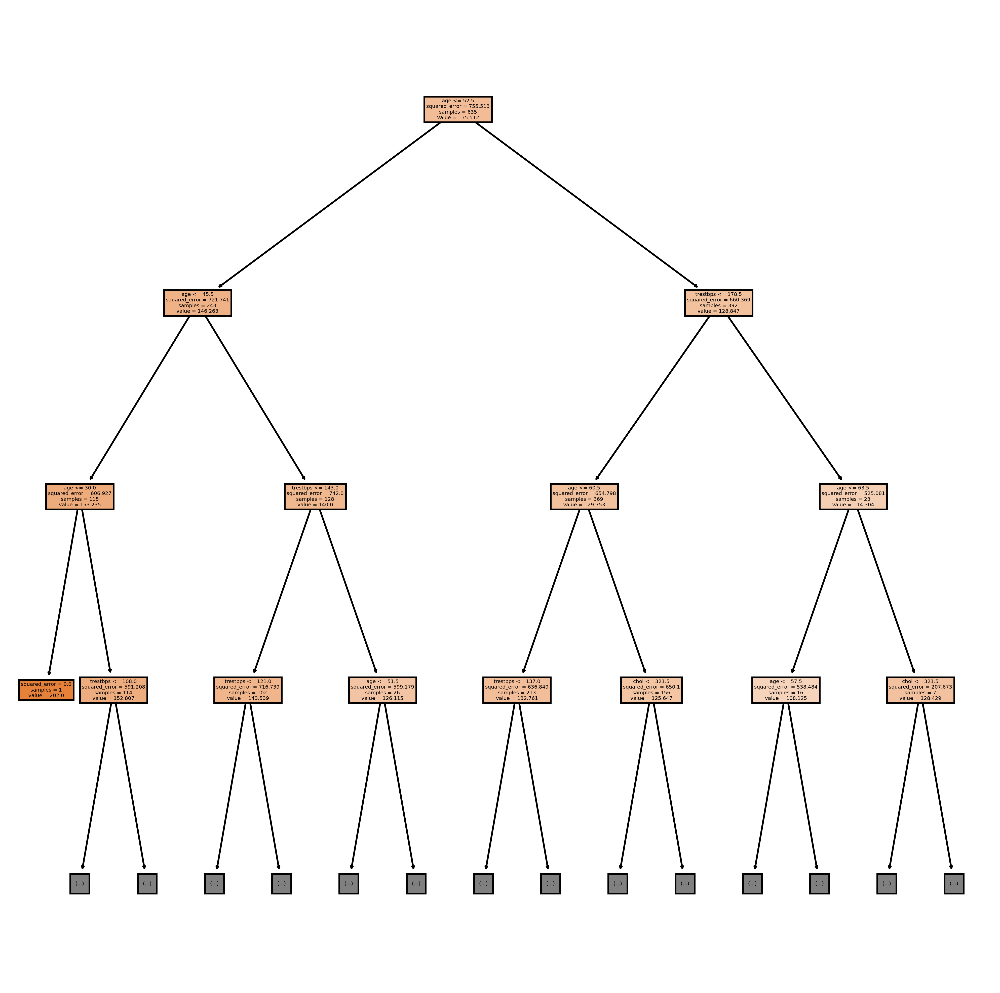

In [86]:
tree.plot_tree(dtr, feature_names=x.columns,max_depth=3, filled=True)
plt.show()

# Model Evaluation and Analysis

In [87]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [88]:
from sklearn.model_selection import GridSearchCV

In [89]:
params = {
    'criterion' : ['squared_error','absolute_error'],
    'max_depth' : [3,5,7,9,11],
    'splitter' :['best','random']
}

In [90]:
grid = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=params,
                   verbose=1)

In [91]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [3, 5, 7, 9, 11],
                         'splitter': ['best', 'random']},
             verbose=1)

In [92]:
grid.best_params_

{'criterion': 'squared_error', 'max_depth': 3, 'splitter': 'random'}

In [93]:
dtr = DecisionTreeRegressor(criterion='squared_error',
                           max_depth=3,splitter='best')

In [94]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [95]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)

(0.15952671712714406, 0.08987011443345083)

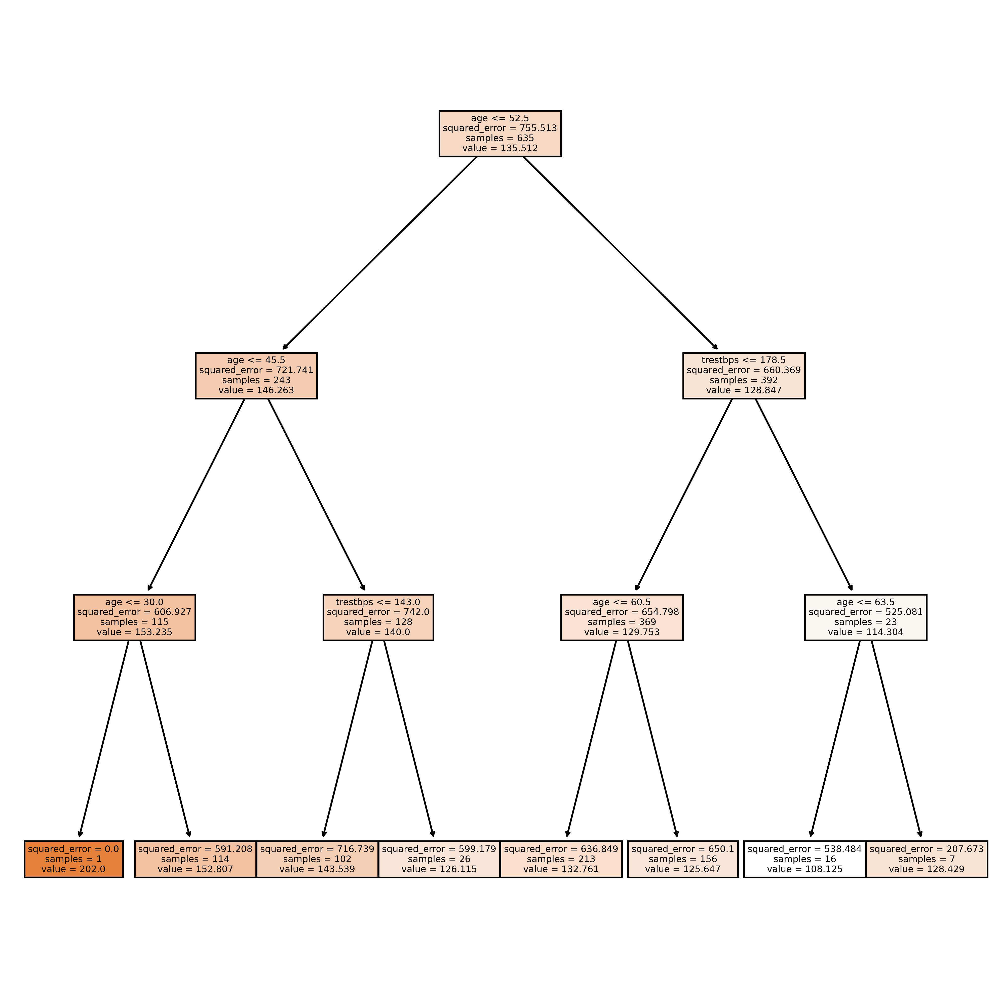

In [96]:
tree.plot_tree(dtr, feature_names=x.columns,filled=True)
plt.show()